In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import re
import plotly.express as px
import plotly.graph_objects as go
import pandas_datareader as web
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

pd.set_option('display.max_rows', 350)

In [2]:
files = [file for file in os.listdir('./dataset')]
files

['holidays_events.csv',
 'oil.csv',
 'sample_submission.csv',
 'stores.csv',
 'test.csv',
 'train.csv',
 'transactions.csv']

In [3]:
dict_files = {re.sub(r'\.\w+', '', files[i], flags=re.I):pd.read_csv('./dataset/'+files[i]) for i in range(len(files))}

In [4]:
def diagnose_data(df):
    print(f'shape:\n{df.shape}\n')
    print(f'columns:\n{sorted(df.columns)}\n')
    print(f'n dtypes:\n{df.dtypes.value_counts()}\n')
    print(f'n uniques:')
    for col in df.columns:
        print(f'{col}: {df[col].nunique()}')
    print(f'\nunique values:')
    for col in df.columns:
        print(f'{col}: {df[col].unique()}')
    print(f'\nnull values:')
    for col in df.columns:
        print(f'{col}: {df[col].isnull().sum()}')
    print('\ninfo:')
    df.info()
    return df.head()

In [5]:
date_list_df = [key for key in dict_files.keys() if 'date' in dict_files[key].columns]
date_list_df

['holidays_events', 'oil', 'test', 'train', 'transactions']

In [6]:
for df in date_list_df:
    dict_files[df]['date'] = pd.to_datetime(dict_files[df]['date'], format='%Y-%m-%d')

In [7]:
holidays_df = dict_files['holidays_events']
holidays_df.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [8]:
oil_df = dict_files['oil']
oil_df.head()

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20


In [9]:
sample_submission_df = dict_files['sample_submission']
sample_submission_df.head()

,id,sales
0,3000888,0.0
1,3000889,0.0
2,3000890,0.0
3,3000891,0.0
4,3000892,0.0


In [10]:
stores_df = dict_files['stores']
stores_df.head()

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [11]:
test_df = dict_files['test']
test_df.head()

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0


In [12]:
train_df = dict_files['train']
train_df.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


In [13]:
transactions_df = dict_files['transactions']
transactions_df.head()

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


In [14]:
diagnose_data(train_df)

shape:
(3000888, 6)

columns:
['date', 'family', 'id', 'onpromotion', 'sales', 'store_nbr']

n dtypes:
int64             3
float64           1
object            1
datetime64[ns]    1
dtype: int64

n uniques:
id: 3000888
date: 1684
store_nbr: 54
family: 33
sales: 379610
onpromotion: 362

unique values:
id: [      0       1       2 ... 3000885 3000886 3000887]
date: ['2013-01-01T00:00:00.000000000' '2013-01-02T00:00:00.000000000'
 '2013-01-03T00:00:00.000000000' ... '2017-08-13T00:00:00.000000000'
 '2017-08-14T00:00:00.000000000' '2017-08-15T00:00:00.000000000']
store_nbr: [ 1 10 11 12 13 14 15 16 17 18 19  2 20 21 22 23 24 25 26 27 28 29  3 30
 31 32 33 34 35 36 37 38 39  4 40 41 42 43 44 45 46 47 48 49  5 50 51 52
 53 54  6  7  8  9]
family: ['AUTOMOTIVE' 'BABY CARE' 'BEAUTY' 'BEVERAGES' 'BOOKS' 'BREAD/BAKERY'
 'CELEBRATION' 'CLEANING' 'DAIRY' 'DELI' 'EGGS' 'FROZEN FOODS' 'GROCERY I'
 'GROCERY II' 'HARDWARE' 'HOME AND KITCHEN I' 'HOME AND KITCHEN II'
 'HOME APPLIANCES' 'HOME CARE' 'LAD

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


In [15]:
diagnose_data(test_df)

shape:
(28512, 5)

columns:
['date', 'family', 'id', 'onpromotion', 'store_nbr']

n dtypes:
int64             3
object            1
datetime64[ns]    1
dtype: int64

n uniques:
id: 28512
date: 16
store_nbr: 54
family: 33
onpromotion: 212

unique values:
id: [3000888 3000889 3000890 ... 3029397 3029398 3029399]
date: ['2017-08-16T00:00:00.000000000' '2017-08-17T00:00:00.000000000'
 '2017-08-18T00:00:00.000000000' '2017-08-19T00:00:00.000000000'
 '2017-08-20T00:00:00.000000000' '2017-08-21T00:00:00.000000000'
 '2017-08-22T00:00:00.000000000' '2017-08-23T00:00:00.000000000'
 '2017-08-24T00:00:00.000000000' '2017-08-25T00:00:00.000000000'
 '2017-08-26T00:00:00.000000000' '2017-08-27T00:00:00.000000000'
 '2017-08-28T00:00:00.000000000' '2017-08-29T00:00:00.000000000'
 '2017-08-30T00:00:00.000000000' '2017-08-31T00:00:00.000000000']
store_nbr: [ 1 10 11 12 13 14 15 16 17 18 19  2 20 21 22 23 24 25 26 27 28 29  3 30
 31 32 33 34 35 36 37 38 39  4 40 41 42 43 44 45 46 47 48 49  5 50 51 52
 53 

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0


In [16]:
daily = train_df.set_index('date').groupby('store_nbr').resample('D')['sales'].sum().reset_index()
px.line(
    daily, 
    x='date', 
    y='sales', 
    color='store_nbr',
    title='Daily total sales of the stores'
)

In [17]:
train_df[train_df['sales']==0]

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0
...,...,...,...,...,...,...
3000839,3000839,2017-08-15,8,HOME APPLIANCES,0.0,0
3000853,3000853,2017-08-15,8,SCHOOL AND OFFICE SUPPLIES,0.0,0
3000856,3000856,2017-08-15,9,BABY CARE,0.0,0
3000859,3000859,2017-08-15,9,BOOKS,0.0,0


In [18]:
train_df[train_df['sales']!=0]

,id,date,store_nbr,family,sales,onpromotion
563,563,2013-01-01,25,BEAUTY,2.000,0
564,564,2013-01-01,25,BEVERAGES,810.000,0
566,566,2013-01-01,25,BREAD/BAKERY,180.589,0
568,568,2013-01-01,25,CLEANING,186.000,0
569,569,2013-01-01,25,DAIRY,143.000,0
...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.133,0
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.553,1
3000885,3000885,2017-08-15,9,PRODUCE,2419.729,148
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8


In [19]:
train_df[(train_df['store_nbr'] == 25) & (train_df['sales'] == 0) & (train_df['family'] == 'BEAUTY')]

,id,date,store_nbr,family,sales,onpromotion
9473,9473,2013-01-06,25,BEAUTY,0.0,0
14819,14819,2013-01-09,25,BEAUTY,0.0,0
25511,25511,2013-01-15,25,BEAUTY,0.0,0
29075,29075,2013-01-17,25,BEAUTY,0.0,0
37985,37985,2013-01-22,25,BEAUTY,0.0,0
...,...,...,...,...,...,...
2926607,2926607,2017-07-05,25,BEAUTY,0.0,0
2935517,2935517,2017-07-10,25,BEAUTY,0.0,0
2939081,2939081,2017-07-12,25,BEAUTY,0.0,0
2965811,2965811,2017-07-27,25,BEAUTY,0.0,0


In [20]:
train_df = train_df[train_df['sales']!=0]
train_df.corr(method='spearman')['sales']

id            -0.025803
store_nbr      0.035234
sales          1.000000
onpromotion    0.488710
Name: sales, dtype: float64

## TRANSACTION DATAFRAME ANALYSIS

In [21]:
diagnose_data(transactions_df)

shape:
(83488, 3)

columns:
['date', 'store_nbr', 'transactions']

n dtypes:
int64             2
datetime64[ns]    1
dtype: int64

n uniques:
date: 1682
store_nbr: 54
transactions: 4993

unique values:
date: ['2013-01-01T00:00:00.000000000' '2013-01-02T00:00:00.000000000'
 '2013-01-03T00:00:00.000000000' ... '2017-08-13T00:00:00.000000000'
 '2017-08-14T00:00:00.000000000' '2017-08-15T00:00:00.000000000']
store_nbr: [25  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 23 24 26 27
 28 30 31 32 33 34 35 37 38 39 40 41 43 44 45 46 47 48 49 50 51 54 36 53
 20 29 21 42 22 52]
transactions: [ 770 2111 2358 ... 4553 4400 4392]

null values:
date: 0
store_nbr: 0
transactions: 0

info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83488 entries, 0 to 83487
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          83488 non-null  datetime64[ns]
 1   store_nbr     83488 non-null  int64         

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


In [22]:
diagnose_data(train_df.groupby(['date', 'store_nbr'])['sales'].sum().reset_index())

shape:
(83606, 3)

columns:
['date', 'sales', 'store_nbr']

n dtypes:
float64           1
datetime64[ns]    1
int64             1
dtype: int64

n uniques:
date: 1684
store_nbr: 54
sales: 83553

unique values:
date: ['2013-01-01T00:00:00.000000000' '2013-01-02T00:00:00.000000000'
 '2013-01-03T00:00:00.000000000' ... '2017-08-13T00:00:00.000000000'
 '2017-08-14T00:00:00.000000000' '2017-08-15T00:00:00.000000000']
store_nbr: [25  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 23 24 26 27
 28 30 31 32 33 34 35 37 38 39 40 41 43 44 45 46 47 48 49 50 51 54 36 53
 20 29 21 42 22 52]
sales: [ 2511.618999  7417.148    10266.718981 ... 18600.046     8208.189
 12666.858   ]

null values:
date: 0
store_nbr: 0
sales: 0

info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83606 entries, 0 to 83605
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date       83606 non-null  datetime64[ns]
 1   store_nbr  836

,date,store_nbr,sales
0,2013-01-01,25,2511.618999
1,2013-01-02,1,7417.148000
2,2013-01-02,2,10266.718981
3,2013-01-02,3,24060.348000
4,2013-01-02,4,10200.083980


In [23]:
merge_df_train_trans = pd.merge(
            train_df.groupby(['date', 'store_nbr']).sales.sum().reset_index(),
            transactions_df, 
            how='left'
        )
diagnose_data(merge_df_train_trans)

shape:
(83606, 4)

columns:
['date', 'sales', 'store_nbr', 'transactions']

n dtypes:
float64           2
datetime64[ns]    1
int64             1
dtype: int64

n uniques:
date: 1684
store_nbr: 54
sales: 83553
transactions: 4993

unique values:
date: ['2013-01-01T00:00:00.000000000' '2013-01-02T00:00:00.000000000'
 '2013-01-03T00:00:00.000000000' ... '2017-08-13T00:00:00.000000000'
 '2017-08-14T00:00:00.000000000' '2017-08-15T00:00:00.000000000']
store_nbr: [25  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 23 24 26 27
 28 30 31 32 33 34 35 37 38 39 40 41 43 44 45 46 47 48 49 50 51 54 36 53
 20 29 21 42 22 52]
sales: [ 2511.618999  7417.148    10266.718981 ... 18600.046     8208.189
 12666.858   ]
transactions: [ 770. 2111. 2358. ... 4553. 4400. 4392.]

null values:
date: 0
store_nbr: 0
sales: 0
transactions: 118

info:
<class 'pandas.core.frame.DataFrame'>
Int64Index: 83606 entries, 0 to 83605
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype         
-

,date,store_nbr,sales,transactions
0,2013-01-01,25,2511.618999,770.0
1,2013-01-02,1,7417.148000,2111.0
2,2013-01-02,2,10266.718981,2358.0
3,2013-01-02,3,24060.348000,3487.0
4,2013-01-02,4,10200.083980,1922.0


In [24]:
merge_df_train_trans.corr('spearman')['sales']

store_nbr       0.166033
sales           1.000000
transactions    0.817464
Name: sales, dtype: float64

In [25]:
trend_df = merge_df_train_trans.copy(deep=True)
trend_df['year'] = trend_df['date'].dt.year
trend_df['day_of_week'] = trend_df['date'].dt.dayofweek + 1
trend_df = trend_df.groupby(['year', 'day_of_week'])['transactions'].mean().reset_index()

px.line(x='day_of_week', y='transactions', data_frame=trend_df , color='year')

## HOLIDAY DATAFRAME ANALYSIS

In [26]:
diagnose_data(holidays_df)

shape:
(350, 6)

columns:
['date', 'description', 'locale', 'locale_name', 'transferred', 'type']

n dtypes:
object            4
datetime64[ns]    1
bool              1
dtype: int64

n uniques:
date: 312
type: 6
locale: 3
locale_name: 24
description: 103
transferred: 2

unique values:
date: ['2012-03-02T00:00:00.000000000' '2012-04-01T00:00:00.000000000'
 '2012-04-12T00:00:00.000000000' '2012-04-14T00:00:00.000000000'
 '2012-04-21T00:00:00.000000000' '2012-05-12T00:00:00.000000000'
 '2012-06-23T00:00:00.000000000' '2012-06-25T00:00:00.000000000'
 '2012-07-03T00:00:00.000000000' '2012-07-23T00:00:00.000000000'
 '2012-08-05T00:00:00.000000000' '2012-08-10T00:00:00.000000000'
 '2012-08-15T00:00:00.000000000' '2012-08-24T00:00:00.000000000'
 '2012-09-28T00:00:00.000000000' '2012-10-07T00:00:00.000000000'
 '2012-10-09T00:00:00.000000000' '2012-10-12T00:00:00.000000000'
 '2012-11-02T00:00:00.000000000' '2012-11-03T00:00:00.000000000'
 '2012-11-06T00:00:00.000000000' '2012-11-07T00:00:00.0000

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [27]:
holidays_df.set_index('date', inplace=True)

In [28]:
holiday_rdy = pd.DataFrame(index=pd.date_range(start='2013-01-01', end='2017-08-15'))
holiday_rdy['day of week'] = holiday_rdy.index.dayofweek + 1
holiday_rdy['work day'] = holiday_rdy['day of week'].apply(lambda x: x < 6)

holidays_df['locale_name'] = holidays_df['locale_name'].str.replace(' ', '')

duplicates = holidays_df[holidays_df.index.duplicated(keep=False)]
get_duplicate_values_index = duplicates.groupby(duplicates.index)['locale_name'].value_counts().index

In [29]:
from itertools import chain
from collections import OrderedDict

d = OrderedDict()
for date, locale_name in get_duplicate_values_index:
    d.setdefault(date, []).append(locale_name)

duplicate_list = []
for key, val in d.items():
    duplicate_list.append((key, ' '.join(val)))
duplicate_list

[(Timestamp('2012-06-25 00:00:00'), 'Imbabura Latacunga Machala'),
 (Timestamp('2012-07-03 00:00:00'), 'ElCarmen SantoDomingo'),
 (Timestamp('2012-12-22 00:00:00'), 'Ecuador Salinas'),
 (Timestamp('2012-12-24 00:00:00'), 'Ecuador'),
 (Timestamp('2012-12-31 00:00:00'), 'Ecuador'),
 (Timestamp('2013-05-12 00:00:00'), 'Ecuador Puyo'),
 (Timestamp('2013-06-25 00:00:00'), 'Imbabura Latacunga Machala'),
 (Timestamp('2013-07-03 00:00:00'), 'ElCarmen SantoDomingo'),
 (Timestamp('2013-12-22 00:00:00'), 'Ecuador Salinas'),
 (Timestamp('2014-06-25 00:00:00'), 'Ecuador Imbabura Latacunga Machala'),
 (Timestamp('2014-07-03 00:00:00'), 'ElCarmen SantoDomingo'),
 (Timestamp('2014-12-22 00:00:00'), 'Ecuador Salinas'),
 (Timestamp('2014-12-26 00:00:00'), 'Ecuador'),
 (Timestamp('2015-06-25 00:00:00'), 'Imbabura Latacunga Machala'),
 (Timestamp('2015-07-03 00:00:00'), 'ElCarmen SantoDomingo'),
 (Timestamp('2015-12-22 00:00:00'), 'Ecuador Salinas'),
 (Timestamp('2016-04-21 00:00:00'), 'Ecuador Riobamba')

In [30]:
holidays_df = holidays_df.groupby(holidays_df.index).first()

In [31]:
for date, locale_name in duplicate_list:
    holidays_df.loc[date, 'locale_name'] = locale_name 

holidays_df

,type,locale,locale_name,description,transferred
date,,,,,
2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
2012-05-12,Holiday,Local,Puyo,Cantonizacion del Puyo,False
2012-06-23,Holiday,Local,Guaranda,Cantonizacion de Guaranda,False
2012-06-25,Holiday,Regional,Imbabura Latacunga Machala,Provincializacion de Imbabura,False
2012-07-03,Holiday,Local,ElCarmen SantoDomingo,Fundacion de Santo Domingo,False


In [32]:
holiday_rdy = pd.merge(holiday_rdy, holidays_df, how='left', left_index=True, right_index=True)

In [33]:
holiday_rdy.loc[holiday_rdy['type'] == 'Work Day', 'work day'] = True
holiday_rdy.loc[
    (holiday_rdy['type'].isin(['Holiday', 'Transfer', 'Additional', 'Bridge'])) & 
    (holiday_rdy['locale_name'].str.contains('Ecuador', na=False)),
    'work day'
] = False

holiday_rdy.drop('locale', axis='columns', inplace=True)

In [34]:
holiday_rdy.loc[holiday_rdy['transferred'] == True, 'work day'] = True
holiday_rdy.loc[holiday_rdy['transferred'] == True]

,day of week,work day,type,locale_name,description,transferred
2013-10-09,3,True,Holiday,Ecuador,Independencia de Guayaquil,True
2014-10-09,4,True,Holiday,Ecuador,Independencia de Guayaquil,True
2016-05-24,2,True,Holiday,Ecuador,Batalla de Pichincha,True
2016-07-25,1,True,Holiday,Guayaquil,Fundacion de Guayaquil,True
2016-08-10,3,True,Holiday,Ecuador,Primer Grito de Independencia,True
2017-01-01,7,True,Holiday,Ecuador,Primer dia del ano,True
2017-04-12,3,True,Holiday,Cuenca,Fundacion de Cuenca,True
2017-05-24,3,True,Holiday,Ecuador,Batalla de Pichincha,True
2017-08-10,4,True,Holiday,Ecuador,Primer Grito de Independencia,True


In [35]:
holiday_rdy[holiday_rdy['type'] == 'Event']

,day of week,work day,type,locale_name,description,transferred
2014-05-11,7,False,Event,Ecuador,Dia de la Madre,False
2014-06-12,4,True,Event,Ecuador,Inauguracion Mundial de futbol Brasil,False
2014-06-15,7,False,Event,Ecuador,Mundial de futbol Brasil: Ecuador-Suiza,False
2014-06-20,5,True,Event,Ecuador,Mundial de futbol Brasil: Ecuador-Honduras,False
2014-06-28,6,False,Event,Ecuador,Mundial de futbol Brasil: Octavos de Final,False
2014-06-29,7,False,Event,Ecuador,Mundial de futbol Brasil: Octavos de Final,False
2014-06-30,1,True,Event,Ecuador,Mundial de futbol Brasil: Octavos de Final,False
2014-07-01,2,True,Event,Ecuador,Mundial de futbol Brasil: Octavos de Final,False
2014-07-04,5,True,Event,Ecuador,Mundial de futbol Brasil: Cuartos de Final,False
2014-07-05,6,False,Event,Ecuador,Mundial de futbol Brasil: Cuartos de Final,False


In [36]:
holiday_rdy.loc[holiday_rdy['description'].str.contains('Terremoto', na=False), 'description'] = 'Earthquake'
holiday_rdy.loc[holiday_rdy['description'].str.contains('futbol', na=False), 'description'] = 'Football'

In [37]:
events = holiday_rdy[holiday_rdy['type'] == 'Event']
sales = train_df.groupby('date')['sales'].sum()

events_with_sales = pd.merge(events, sales, how='left', left_index=True, right_index=True)
print(events_with_sales.groupby('description')['sales'].mean())
print(f"all mean sales {events_with_sales['sales'].mean()}")

description
Black Friday       647508.781658
Cyber Monday       777344.484674
Dia de la Madre    632258.371941
Earthquake         866433.436092
Football           569432.001918
Name: sales, dtype: float64
all mean sales 754441.9125354694


In [38]:
events_with_sales

,day of week,work day,type,locale_name,description,transferred,sales
2014-05-11,7,False,Event,Ecuador,Dia de la Madre,False,4.545129e+05
2014-06-12,4,True,Event,Ecuador,Football,False,3.294081e+05
2014-06-15,7,False,Event,Ecuador,Football,False,4.412799e+05
2014-06-20,5,True,Event,Ecuador,Football,False,3.692068e+05
2014-06-28,6,False,Event,Ecuador,Football,False,5.108708e+05
2014-06-29,7,False,Event,Ecuador,Football,False,5.672189e+05
2014-06-30,1,True,Event,Ecuador,Football,False,4.293241e+05
2014-07-01,2,True,Event,Ecuador,Football,False,7.204806e+05
2014-07-04,5,True,Event,Ecuador,Football,False,5.954243e+05
2014-07-05,6,False,Event,Ecuador,Football,False,8.173071e+05


In [39]:
descriptions = pd.get_dummies(holiday_rdy['description'])[['Earthquake', 'Cyber Monday', 'Black Friday']]
descriptions

,Earthquake,Cyber Monday,Black Friday
2013-01-01,0,0,0
2013-01-02,0,0,0
2013-01-03,0,0,0
2013-01-04,0,0,0
2013-01-05,0,0,0
...,...,...,...
2017-08-11,0,0,0
2017-08-12,0,0,0
2017-08-13,0,0,0
2017-08-14,0,0,0


In [40]:
holiday_rdy = pd.merge(holiday_rdy, descriptions, how='left', left_index=True, right_index=True)

In [41]:
holiday_rdy

,day of week,work day,type,locale_name,description,transferred,Earthquake,Cyber Monday,Black Friday
2013-01-01,2,False,Holiday,Ecuador,Primer dia del ano,False,0,0,0
2013-01-02,3,True,NaN,NaN,NaN,NaN,0,0,0
2013-01-03,4,True,NaN,NaN,NaN,NaN,0,0,0
2013-01-04,5,True,NaN,NaN,NaN,NaN,0,0,0
2013-01-05,6,True,Work Day,Ecuador,Recupero puente Navidad,False,0,0,0
...,...,...,...,...,...,...,...,...,...
2017-08-11,5,False,Transfer,Ecuador,Traslado Primer Grito de Independencia,False,0,0,0
2017-08-12,6,False,NaN,NaN,NaN,NaN,0,0,0
2017-08-13,7,False,NaN,NaN,NaN,NaN,0,0,0
2017-08-14,1,True,NaN,NaN,NaN,NaN,0,0,0


In [42]:
holiday_rdy['locale_name'] = holiday_rdy['locale_name'].fillna('Ecuador')
holiday_rdy

,day of week,work day,type,locale_name,description,transferred,Earthquake,Cyber Monday,Black Friday
2013-01-01,2,False,Holiday,Ecuador,Primer dia del ano,False,0,0,0
2013-01-02,3,True,NaN,Ecuador,NaN,NaN,0,0,0
2013-01-03,4,True,NaN,Ecuador,NaN,NaN,0,0,0
2013-01-04,5,True,NaN,Ecuador,NaN,NaN,0,0,0
2013-01-05,6,True,Work Day,Ecuador,Recupero puente Navidad,False,0,0,0
...,...,...,...,...,...,...,...,...,...
2017-08-11,5,False,Transfer,Ecuador,Traslado Primer Grito de Independencia,False,0,0,0
2017-08-12,6,False,NaN,Ecuador,NaN,NaN,0,0,0
2017-08-13,7,False,NaN,Ecuador,NaN,NaN,0,0,0
2017-08-14,1,True,NaN,Ecuador,NaN,NaN,0,0,0


In [43]:
holiday_rdy.drop(columns=['type', 'description', 'transferred'], inplace=True)

In [44]:
holiday_rdy

,day of week,work day,locale_name,Earthquake,Cyber Monday,Black Friday
2013-01-01,2,False,Ecuador,0,0,0
2013-01-02,3,True,Ecuador,0,0,0
2013-01-03,4,True,Ecuador,0,0,0
2013-01-04,5,True,Ecuador,0,0,0
2013-01-05,6,True,Ecuador,0,0,0
...,...,...,...,...,...,...
2017-08-11,5,False,Ecuador,0,0,0
2017-08-12,6,False,Ecuador,0,0,0
2017-08-13,7,False,Ecuador,0,0,0
2017-08-14,1,True,Ecuador,0,0,0


In [46]:
holiday_rdy['date'] = holiday_rdy.index
holiday_rdy['date'] = holiday_rdy['date'].dt.to_period('D')
holiday_rdy.set_index('date', inplace=True)

In [47]:
holiday_rdy = pd.get_dummies(data=holiday_rdy, columns=['day of week'])

In [48]:
holiday_rdy.head()

,work day,locale_name,Earthquake,Cyber Monday,Black Friday,day of week_1,day of week_2,day of week_3,day of week_4,day of week_5,day of week_6,day of week_7
date,,,,,,,,,,,,
2013-01-01,False,Ecuador,0,0,0,0,1,0,0,0,0,0
2013-01-02,True,Ecuador,0,0,0,0,0,1,0,0,0,0
2013-01-03,True,Ecuador,0,0,0,0,0,0,1,0,0,0
2013-01-04,True,Ecuador,0,0,0,0,0,0,0,1,0,0
2013-01-05,True,Ecuador,0,0,0,0,0,0,0,0,1,0


## OIL DATAFRAME ANALYSIS

In [49]:
diagnose_data(oil_df)

shape:
(1218, 2)

columns:
['date', 'dcoilwtico']

n dtypes:
datetime64[ns]    1
float64           1
dtype: int64

n uniques:
date: 1218
dcoilwtico: 998

unique values:
date: ['2013-01-01T00:00:00.000000000' '2013-01-02T00:00:00.000000000'
 '2013-01-03T00:00:00.000000000' ... '2017-08-29T00:00:00.000000000'
 '2017-08-30T00:00:00.000000000' '2017-08-31T00:00:00.000000000']
dcoilwtico: [   nan  93.14  92.97  93.12  93.2   93.21  93.08  93.81  93.6   94.27
  93.26  94.28  95.49  95.61  96.09  95.06  95.35  95.15  95.95  97.62
  97.98  97.65  97.46  96.21  96.68  96.44  95.84  95.71  97.01  97.48
  97.03  97.3   96.69  94.92  92.79  92.74  92.63  92.84  92.03  90.71
  90.13  90.88  90.47  91.53  92.01  92.07  92.44  92.47  93.03  93.49
  93.71  92.46  93.41  94.55  95.99  96.53  97.24  97.1   97.23  95.02
  92.76  93.36  94.18  94.59  93.44  91.23  88.75  88.73  86.65  87.83
  88.04  88.81  89.21  91.07  93.27  94.09  93.22  90.74  93.7   95.25
  95.8   95.28  96.24  95.81  94.76  93.96  9

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20


In [50]:
oil_df = oil_df.set_index('date').resample('D')['dcoilwtico'].sum().reset_index()
oil_df['dcoilwtico'] = oil_df['dcoilwtico'].apply(lambda x: np.nan if x == 0 else x)
oil_df['dcoilwtico_interpolated'] = oil_df.dcoilwtico.interpolate()

oil_df

,date,dcoilwtico,dcoilwtico_interpolated
0,2013-01-01,NaN,NaN
1,2013-01-02,93.14,93.140000
2,2013-01-03,92.97,92.970000
3,2013-01-04,93.12,93.120000
4,2013-01-05,NaN,93.146667
...,...,...,...
1699,2017-08-27,NaN,46.816667
1700,2017-08-28,46.40,46.400000
1701,2017-08-29,46.46,46.460000
1702,2017-08-30,45.96,45.960000


In [51]:
oil_plot = oil_df.melt(id_vars=['date'], var_name='Legend') 

px.line(oil_plot.sort_values(['Legend', 'date'], ascending=[False, True]), x='date',
        y='value', color='Legend', title='Daily Oil Price')

In [52]:
oil_rdy = oil_df.loc[:, ['date', 'dcoilwtico_interpolated']]
oil_rdy.loc[oil_rdy['dcoilwtico_interpolated'].isnull(), 'dcoilwtico_interpolated'] = 93.1
oil_rdy['date'] = oil_rdy['date'].dt.to_period('D')
oil_rdy.set_index('date', inplace=True)

In [53]:
oil_rdy

,dcoilwtico_interpolated
date,
2013-01-01,93.100000
2013-01-02,93.140000
2013-01-03,92.970000
2013-01-04,93.120000
2013-01-05,93.146667
...,...
2017-08-27,46.816667
2017-08-28,46.400000
2017-08-29,46.460000


In [54]:
a = pd.merge(
    train_df.groupby(["date", "family"]).sales.sum().reset_index(),
    oil_df.drop("dcoilwtico", axis='columns'), 
    how="left"
)

c = a.groupby("family").corr("spearman").reset_index()
c_new = c[c.level_1 == "dcoilwtico_interpolated"][["family", "sales"]].sort_values("sales")

a[a['family'] == 'BEAUTY']


,date,family,sales,dcoilwtico_interpolated
0,2013-01-01,BEAUTY,2.0,NaN
18,2013-01-02,BEAUTY,207.0,93.140000
39,2013-01-03,BEAUTY,125.0,92.970000
60,2013-01-04,BEAUTY,133.0,93.120000
81,2013-01-05,BEAUTY,191.0,93.146667
...,...,...,...,...
47344,2017-08-11,BEAUTY,351.0,48.810000
47376,2017-08-12,BEAUTY,369.0,48.403333
47408,2017-08-13,BEAUTY,433.0,47.996667
47441,2017-08-14,BEAUTY,337.0,47.590000


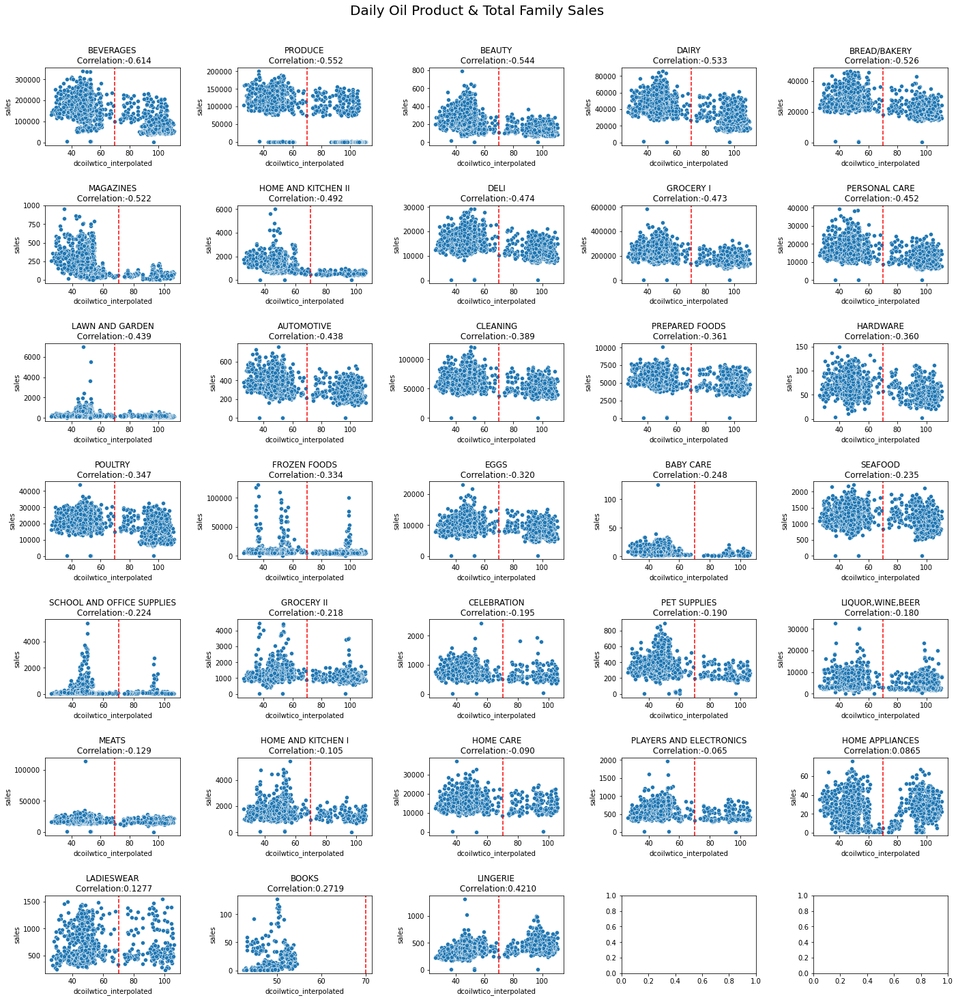

In [55]:
def plot_sales_and_oil_dependency(train, oil):
    a = pd.merge(train.groupby(["date", "family"]).sales.sum().reset_index(),
                 oil.drop("dcoilwtico", axis=1), how="left")
    c = a.groupby("family").corr("spearman").reset_index()
    c = c[c.level_1 == "dcoilwtico_interpolated"][["family", "sales"]].sort_values("sales")

    fig, axes = plt.subplots(7, 5, figsize=(20, 20))
    for i, fam in enumerate(c.family):
        plt.subplot(7, 5, i+1)
        sns.scatterplot(x='dcoilwtico_interpolated', y='sales', data=a[a.family == fam])
        plt.axvline(x=70, color='r', linestyle='--')
        plt.gca().set_title(
            fam + "\n Correlation:" + str(c[c.family == fam].sales.iloc[0])[:6],
            fontsize=12
        )

    plt.tight_layout(pad=2.5)
    plt.suptitle("Daily Oil Product & Total Family Sales \n", fontsize=20, y=1.025)
    plt.show()
    
plot_sales_and_oil_dependency(train_df, oil_df)

In [56]:
oil_rdy['rolling mean (7)'] = oil_rdy['dcoilwtico_interpolated'].rolling(7).mean()
oil_rdy['rolling mean (7)'].fillna(93.1, inplace=True)

In [57]:
oil_rdy

,dcoilwtico_interpolated,rolling mean (7)
date,,
2013-01-01,93.100000,93.100000
2013-01-02,93.140000,93.100000
2013-01-03,92.970000,93.100000
2013-01-04,93.120000,93.100000
2013-01-05,93.146667,93.100000
...,...,...
2017-08-27,46.816667,47.490000
2017-08-28,46.400000,47.348571
2017-08-29,46.460000,47.178571


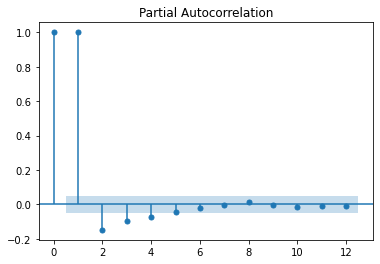

In [58]:
from statsmodels.graphics.tsaplots import plot_pacf
_ = plot_pacf(oil_rdy['rolling mean (7)'], lags=12, method='ywm')  # 1 lag

In [59]:
for i in range(1, 2) :
    oil_rdy[f'oil_lag_{i}'] = oil_rdy['rolling mean (7)'].shift(i)

oil_rdy.fillna(93.1, inplace=True)

In [60]:
oil_rdy

,dcoilwtico_interpolated,rolling mean (7),oil_lag_1
date,,,
2013-01-01,93.100000,93.100000,93.100000
2013-01-02,93.140000,93.100000,93.100000
2013-01-03,92.970000,93.100000,93.100000
2013-01-04,93.120000,93.100000,93.100000
2013-01-05,93.146667,93.100000,93.100000
...,...,...,...
2017-08-27,46.816667,47.490000,47.629048
2017-08-28,46.400000,47.348571,47.490000
2017-08-29,46.460000,47.178571,47.348571


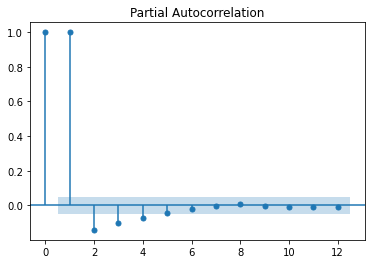

In [61]:
_2 = plot_pacf(oil_rdy['oil_lag_1'], lags=12, method='ywm')  # 1 lag

## STORES DATAFRAME ANALYSIS

In [62]:
diagnose_data(stores_df)

shape:
(54, 5)

columns:
['city', 'cluster', 'state', 'store_nbr', 'type']

n dtypes:
object    3
int64     2
dtype: int64

n uniques:
store_nbr: 54
city: 22
state: 16
type: 5
cluster: 17

unique values:
store_nbr: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49 50 51 52 53 54]
city: ['Quito' 'Santo Domingo' 'Cayambe' 'Latacunga' 'Riobamba' 'Ibarra'
 'Guaranda' 'Puyo' 'Ambato' 'Guayaquil' 'Salinas' 'Daule' 'Babahoyo'
 'Quevedo' 'Playas' 'Libertad' 'Cuenca' 'Loja' 'Machala' 'Esmeraldas'
 'Manta' 'El Carmen']
state: ['Pichincha' 'Santo Domingo de los Tsachilas' 'Cotopaxi' 'Chimborazo'
 'Imbabura' 'Bolivar' 'Pastaza' 'Tungurahua' 'Guayas' 'Santa Elena'
 'Los Rios' 'Azuay' 'Loja' 'El Oro' 'Esmeraldas' 'Manabi']
type: ['D' 'B' 'C' 'E' 'A']
cluster: [13  8  9  4  6 15  7  3 12 16  1 10  2  5 11 14 17]

null values:
store_nbr: 0
city: 0
state: 0
type: 0
cluster: 0

info:
<class 'pandas.core.f

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [63]:
stores_df.set_index('store_nbr', inplace=True)
stores_df.loc[:, ['city', 'state']] = stores_df.loc[:, ['city', 'state']].applymap(lambda x: re.sub(r'\s', '', x))

In [64]:
stores_df.head()

,city,state,type,cluster
store_nbr,,,,
1,Quito,Pichincha,D,13
2,Quito,Pichincha,D,13
3,Quito,Pichincha,D,8
4,Quito,Pichincha,D,9
5,SantoDomingo,SantoDomingodelosTsachilas,D,4


In [65]:
stores_rdy = stores_df.loc[:, ['city', 'state']]
stores_rdy.head()

,city,state
store_nbr,,
1,Quito,Pichincha
2,Quito,Pichincha
3,Quito,Pichincha
4,Quito,Pichincha
5,SantoDomingo,SantoDomingodelosTsachilas


## Preprocessing

In [66]:
train_df['date'] = train_df['date'].dt.to_period('D')
train_rdy = train_df.set_index(['store_nbr', 'family', 'date']).sort_index()
display(train_rdy)

test_df['date'] = test_df['date'].dt.to_period('D')
test_rdy = test_df.set_index(['store_nbr', 'family', 'date']).sort_index()
display(test_rdy)

<ipython-input-66-b74b57356e59>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



id  sales  onpromotion
store_nbr family     date                                   
1         AUTOMOTIVE 2013-01-02     1782    2.0            0
                     2013-01-03     3564    3.0            0
                     2013-01-04     5346    3.0            0
                     2013-01-05     7128    5.0            0
                     2013-01-06     8910    2.0            0
...                                  ...    ...          ...
54        SEAFOOD    2017-08-09  2990063    4.0            0
                     2017-08-10  2991845    2.0            0
                     2017-08-12  2995409    1.0            1
                     2017-08-13  2997191    2.0            0
                     2017-08-15  3000755    3.0            0

[2061758 rows x 3 columns]

id  onpromotion
store_nbr family     date                            
1         AUTOMOTIVE 2017-08-16  3000888            0
                     2017-08-17  3002670            0
                     2017-08-18  3004452            0
                     2017-08-19  3006234            0
                     2017-08-20  3008016            0
...                                  ...          ...
54        SEAFOOD    2017-08-27  3022139            0
                     2017-08-28  3023921            0
                     2017-08-29  3025703            0
                     2017-08-30  3027485            0
                     2017-08-31  3029267            0

[28512 rows x 2 columns]

In [67]:
sdate = '2017-03-25' # start and end of training date
edate = '2017-08-15'

y_arr = []
onpromotion_arr = []
test_onpromotion_arr = []

for nbr in stores_df.index:
    # y_arr
    temp = train_rdy.loc[nbr, 'sales']
    y_arr.append(temp.unstack(['family']).loc[sdate:edate])
    
    # onpromotion_arr
    onpromotion = train_rdy.loc[nbr, 'onpromotion']
    onpromotion = onpromotion.unstack(['family']).loc[sdate:edate].sum(axis=1)
    onpromotion.name = 'onpromotion'
    onpromotion_arr.append(onpromotion)
    
    # test_onpromotion_arr
    test_onpromotion = test_rdy.loc[nbr, 'onpromotion']
    test_onpromotion = test_onpromotion.unstack(['family']).sum(axis=1)
    test_onpromotion.name = 'onpromotion'
    test_onpromotion_arr.append(test_onpromotion)
    
    # sum of all products that are on promotion in the currect store

In [68]:
y_arr[2]

family,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,BREAD/BAKERY,CELEBRATION,CLEANING,DAIRY,DELI,...,MAGAZINES,MEATS,PERSONAL CARE,PET SUPPLIES,PLAYERS AND ELECTRONICS,POULTRY,PREPARED FOODS,PRODUCE,SCHOOL AND OFFICE SUPPLIES,SEAFOOD
date,,,,,,,,,,,,,,,,,,,,,
2017-03-25,13.0,1.0,16.0,12758.0,2.0,1789.6760,66.0,3430.0,3239.0,563.628,...,41.0,953.27500,736.0,28.0,31.0,1386.6720,463.00300,9894.9520,4.0,115.478000
2017-03-26,16.0,1.0,17.0,15434.0,1.0,1997.0859,36.0,2552.0,3514.0,682.952,...,29.0,962.10300,868.0,26.0,33.0,1504.8280,499.72900,9645.2120,5.0,141.371000
2017-03-27,11.0,1.0,5.0,8851.0,NaN,1326.9620,25.0,2038.0,2316.0,373.803,...,18.0,674.10100,437.0,13.0,16.0,988.9590,305.82800,7561.1510,4.0,89.820000
2017-03-28,12.0,1.0,6.0,8200.0,NaN,1180.6150,26.0,1660.0,2024.0,401.800,...,19.0,579.22900,378.0,17.0,18.0,931.7650,293.60700,6758.6777,2.0,96.339005
2017-03-29,8.0,1.0,8.0,9051.0,2.0,1440.7490,48.0,2672.0,2532.0,395.929,...,37.0,748.52300,483.0,21.0,16.0,983.3800,351.83500,11569.5870,NaN,112.625000
2017-03-30,6.0,NaN,4.0,7162.0,1.0,1147.5440,90.0,1617.0,1848.0,356.799,...,13.0,552.08300,369.0,11.0,13.0,760.7650,354.96900,6053.4960,4.0,77.826000
2017-03-31,7.0,2.0,8.0,9839.0,NaN,1552.9600,49.0,2158.0,2982.0,530.488,...,30.0,1675.08500,521.0,30.0,22.0,1866.8980,471.99700,8626.0140,3.0,137.928010
2017-04-01,26.0,5.0,24.0,18210.0,NaN,2105.7440,51.0,4041.0,4448.0,852.963,...,32.0,1372.81300,1253.0,21.0,55.0,2176.7110,571.53503,13351.8880,5.0,133.492000
2017-04-02,13.0,2.0,15.0,13586.0,NaN,1856.8640,24.0,2657.0,3148.0,572.430,...,16.0,957.71800,934.0,25.0,33.0,1353.4860,494.78600,9200.8260,6.0,116.918000


In [69]:
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess

fourier = CalendarFourier(freq='W', order=4)
X_arr = []
X_test_arr = []
store_index = 1

for y, onpromotion, test_onpromotion in zip(y_arr, onpromotion_arr, test_onpromotion_arr): 
    dp = DeterministicProcess(index=y.index,
                              constant=False,
                              order=1,
                              seasonal=False,
                              additional_terms=[fourier],
                              drop=True)
    X = dp.in_sample()
    X_test = dp.out_of_sample(steps=16)
    
#     On promotion
    X = X.merge(onpromotion, how='left', left_index=True, right_index=True)
    X_test = X_test.merge(test_onpromotion, how='left', left_index=True, right_index=True)
    
    # Holidays
    X = X.merge(holiday_rdy, how='left', left_index=True, right_index=True)
    X_test = X_test.merge(holiday_rdy, how='left', left_index=True, right_index=True)
    
    store_state = stores_df.loc[store_index, 'state']
    store_city = stores_df.loc[store_index, 'city']
    
    # Apply local holidays
    for j in X.index: 
        if X.loc[j, 'locale_name'].find(store_state) != -1 or X.loc[j, 'locale_name'].find(store_city) != -1:
            X.loc[j, 'work_day'] = False
    
    for j in X_test.index: 
        if X_test.loc[j, 'locale_name'].find(store_state) != -1 or X_test.loc[j, 'locale_name'].find(store_city) != -1:
            X_test.loc[j, 'work_day'] = False
    
    X.drop(['locale_name'], axis=1, inplace=True)  
    X_test.drop(['locale_name'], axis=1, inplace=True)  
    
    # Oil
    X = X.merge(oil_rdy, how='left', left_index=True, right_index=True)
    X_test = X_test.merge(oil_rdy, how='left', left_index=True, right_index=True)
    
    X_arr.append(X)
    X_test_arr.append(X_test)
    
    store_index += 1
    
X_arr[0]

AttributeError: 'float' object has no attribute 'find'

In [100]:
holiday_rdy

,work day,locale_name,Earthquake,Cyber Monday,Black Friday,day of week_1,day of week_2,day of week_3,day of week_4,day of week_5,day of week_6,day of week_7
date,,,,,,,,,,,,
2013-01-01,False,Ecuador,0,0,0,0,1,0,0,0,0,0
2013-01-02,True,Ecuador,0,0,0,0,0,1,0,0,0,0
2013-01-03,True,Ecuador,0,0,0,0,0,0,1,0,0,0
2013-01-04,True,Ecuador,0,0,0,0,0,0,0,1,0,0
2013-01-05,True,Ecuador,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,False,Ecuador,0,0,0,0,0,0,0,1,0,0
2017-08-12,False,Ecuador,0,0,0,0,0,0,0,0,1,0
2017-08-13,False,Ecuador,0,0,0,0,0,0,0,0,0,1


In [101]:
X_test

,trend,"sin(1,freq=W-SUN)","cos(1,freq=W-SUN)","sin(2,freq=W-SUN)","cos(2,freq=W-SUN)","sin(3,freq=W-SUN)","cos(3,freq=W-SUN)",onpromotion,work day,locale_name,Earthquake,Cyber Monday,Black Friday,day of week_1,day of week_2,day of week_3,day of week_4,day of week_5,day of week_6,day of week_7
2017-08-16,141.0,0.974928,-0.222521,-0.433884,-0.900969,-0.781831,0.623490,524,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-17,142.0,0.433884,-0.900969,-0.781831,0.623490,0.974928,-0.222521,113,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-18,143.0,-0.433884,-0.900969,0.781831,0.623490,-0.974928,-0.222521,278,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-19,144.0,-0.974928,-0.222521,0.433884,-0.900969,0.781831,0.623490,121,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-20,145.0,-0.781831,0.623490,-0.974928,-0.222521,-0.433884,-0.900969,88,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-21,146.0,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,118,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-22,147.0,0.781831,0.623490,0.974928,-0.222521,0.433884,-0.900969,103,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-23,148.0,0.974928,-0.222521,-0.433884,-0.900969,-0.781831,0.623490,364,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-24,149.0,0.433884,-0.900969,-0.781831,0.623490,0.974928,-0.222521,130,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-25,150.0,-0.433884,-0.900969,0.781831,0.623490,-0.974928,-0.222521,294,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
